# 1. Libraries

In [114]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as g
from plotly.subplots import make_subplots
import plotly.express as px
import datetime

# 2. Load data

In [115]:
merged = pd.read_csv('/home/nivelrios/documentos/Mburicao Project/data/external/sil_nivel_merged.csv',index_col=0, parse_dates=True)
picos = pd.read_csv('/home/nivelrios/documentos/Mburicao Project/data/external/peak_nivel_detection.csv')

# 3. Plotting

## 3.1 Overview

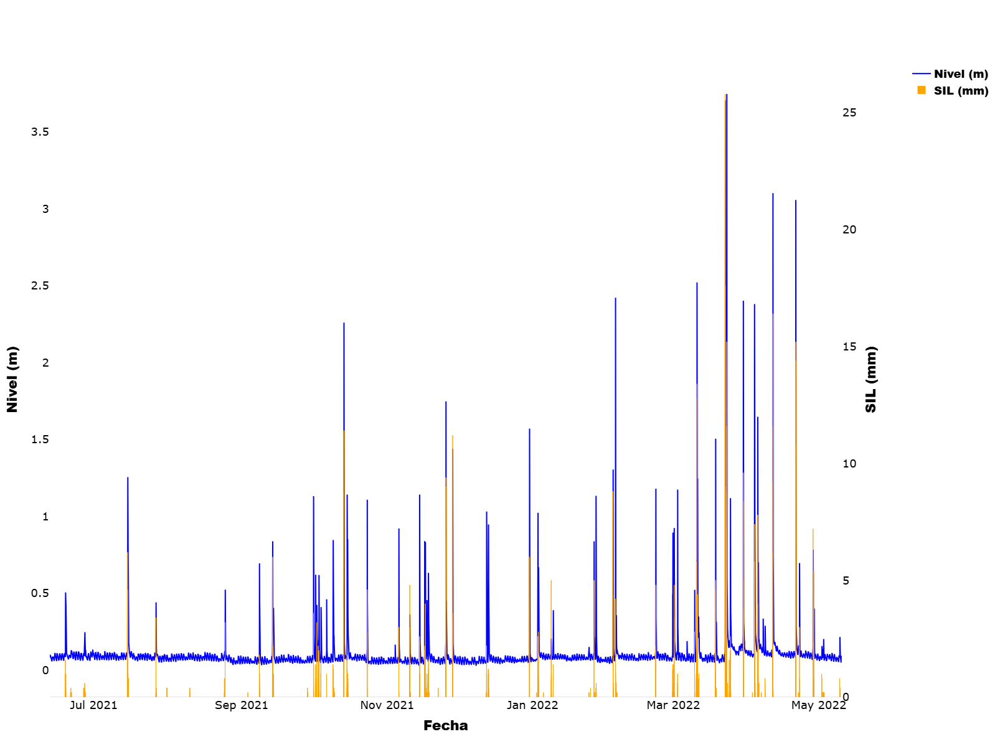

In [108]:


# Crear subgráficos con un eje secundario
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Agregar la serie de nivel de agua
fig.add_trace(
    go.Scatter(
        x=merged.index,
        y=merged["nivel"],
        mode="lines",
        line=dict(color='blue'),
        name="Nivel (m)"
    ),
    secondary_y=False
)

# Agregar la serie de precipitación SIL como barras
fig.add_trace(
    go.Bar(
        x=merged.index,
        y=merged["sil"],
        name="SIL (mm)",
        marker=dict(
            color="orange",        
            opacity=1,             
            line=dict(
                color="orange",   
                width=1           
            )
        ),
    ),
    secondary_y=True
)

# Configuración del diseño
fig.update_layout(
    
    xaxis_title="Fecha",
    legend=dict(
        x=1.02,
        y=1,
        bgcolor='rgba(255,255,255,0)',
        font=dict(
            family="Arial Black",  # Fuente más gruesa
            size=18,               # Tamaño más grande
            color="black"          # Color negro
        )
    ),
    plot_bgcolor='white',   
    paper_bgcolor='white',
    autosize=False,
    width=1200,  # Manteniendo relación 1:1
    height=1200
)

# Ajuste del tamaño y grosor de las etiquetas de los ejes
fig.update_xaxes(
    title_text="Fecha",
    title_font=dict(size=22, family="Arial Black", color="black"),  # Más grande y grueso
    tickfont=dict(size=18, color="black")  # Aumenta tamaño de los valores del eje
)

fig.update_yaxes(
    title_text="Nivel (m)",
    title_font=dict(size=22, family="Arial Black", color="black"),  # Más grande y grueso
    tickfont=dict(size=18, color="black"),
    secondary_y=False
)

fig.update_yaxes(
    title_text="SIL (mm)",
    title_font=dict(size=22, family="Arial Black", color="black"),  # Más grande y grueso
    tickfont=dict(size=18, color="black"),
    secondary_y=True
)

# Mostrar el gráfico
fig.show()



## 3.2 Zoom selection

In [97]:
def pedir_fecha(mensaje):
    print(mensaje)
    year = int(input("Año: "))
    month = int(input("Mes: "))
    day = int(input("Día: "))
    hour = int(input("Hora: "))
    minute = int(input("Minuto: "))
    second = int(input("Segundo: "))
    return datetime.datetime(year, month, day, hour, minute, second)

Ingrese la fecha de inicio:


Año:  2021
Mes:  7
Día:  26
Hora:  21
Minuto:  0
Segundo:  0


Ingrese la fecha de fin:


Año:  2021
Mes:  7
Día:  27
Hora:  12
Minuto:  0
Segundo:  0


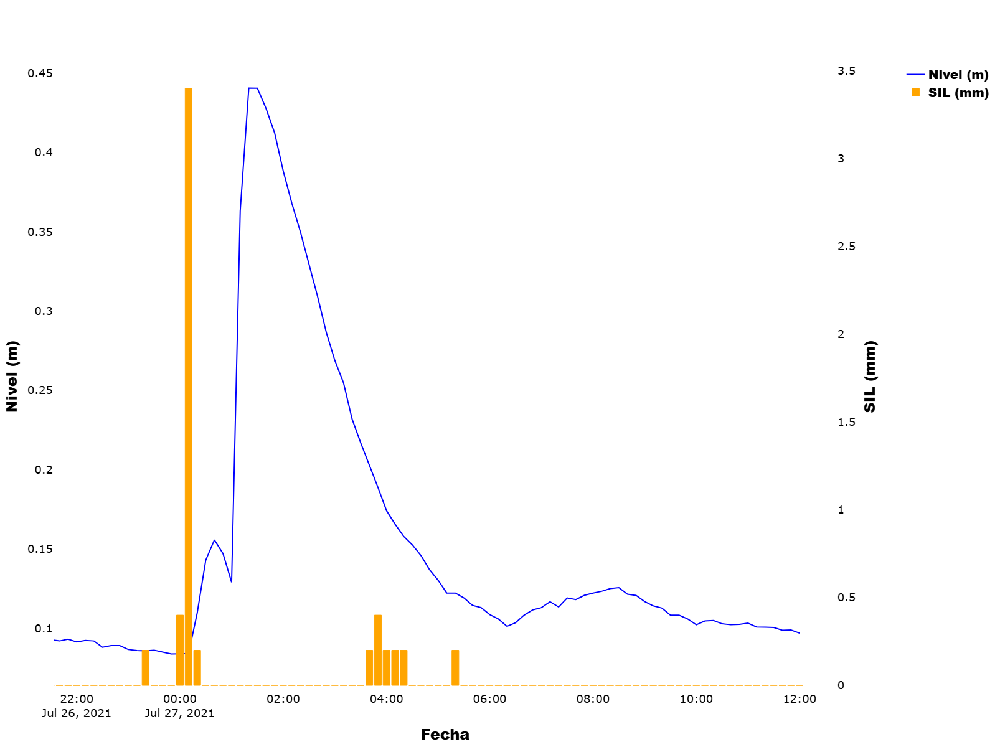

In [59]:
# Filtrar los datos en el rango de fechas especificado
fecha_inicio = pedir_fecha("Ingrese la fecha de inicio:")
fecha_fin = pedir_fecha("Ingrese la fecha de fin:")
merged_filtered = merged.loc[(merged.index >= fecha_inicio) & (merged.index <= fecha_fin)]

# Crear la figura con eje secundario
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Agregar la serie de nivel de agua
fig.add_trace(
    go.Scatter(
        x=merged_filtered.index,
        y=merged_filtered["nivel"],
        mode="lines",
        line=dict(color='blue'),
        name="Nivel (m)"
    ),
    secondary_y=False
)

# Agregar la serie de precipitación SIL como barras
fig.add_trace(
    go.Bar(
        x=merged_filtered.index,
        y=merged_filtered["sil"],
        name="SIL (mm)",
        marker=dict(
            color="orange",
            opacity=1,
            line=dict(
                color="orange",
                width=1
            )
        ),
    ),
    secondary_y=True
)

# Configuración del diseño
fig.update_layout(
    xaxis_title="Fecha",
    legend=dict(
        x=1.02,
        y=1,
        bgcolor='rgba(255,255,255,0)',
        font=dict(
            family="Arial Black",  # Fuente más gruesa
            size=20,               # Tamaño más grande
            color="black"
        )
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    autosize=False,
    width=1200,  # Relación 1:1 cuadrada
    height=1200
)

# Ajuste del tamaño y grosor de las etiquetas de los ejes
fig.update_xaxes(
    title_text="Fecha",
    title_font=dict(size=24, family="Arial Black", color="black"),  # Más grande y en negrita
    tickfont=dict(size=18, color="black")  # Números en los ejes en negro
)

fig.update_yaxes(
    title_text="Nivel (m)",
    title_font=dict(size=24, family="Arial Black", color="black"),  # Más grande y en negrita
    tickfont=dict(size=18, color="black"),  # Números en los ejes en negro
    secondary_y=False
)

fig.update_yaxes(
    title_text="SIL (mm)",
    title_font=dict(size=24, family="Arial Black", color="black"),  # Más grande y en negrita
    tickfont=dict(size=18, color="black"),  # Números en los ejes en negro
    secondary_y=True
)

# Mostrar el gráfico
fig.show()



## 3.3 Peaks

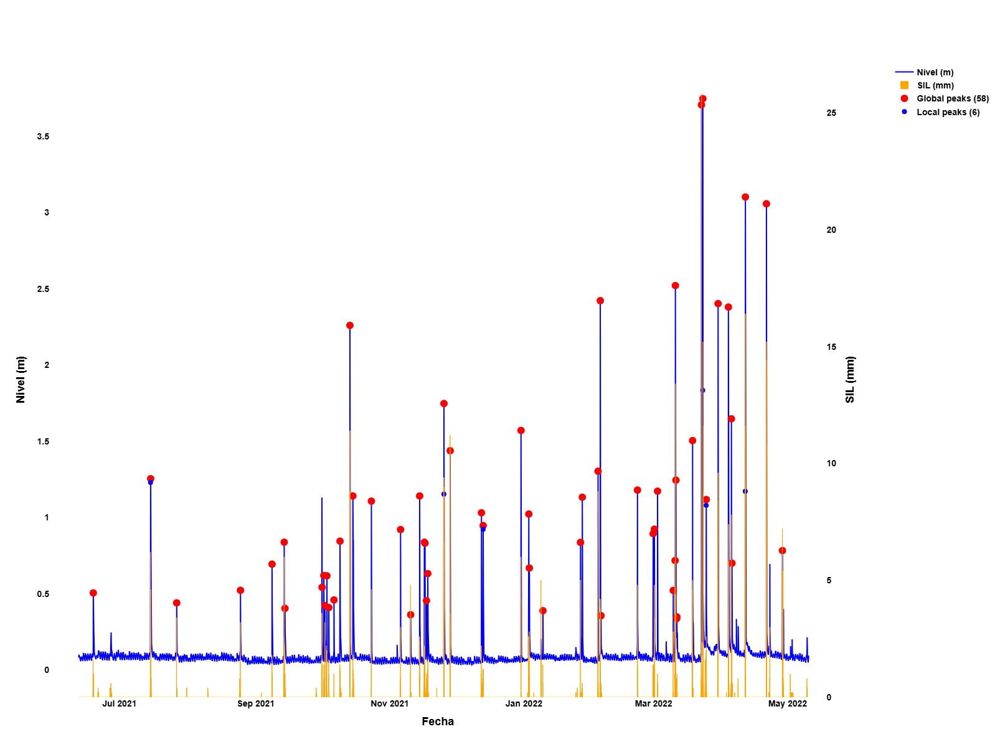

In [121]:
picos['max_global_fecha'] = pd.to_datetime(picos['max_global_fecha'], errors='coerce')
picos['max_local_fecha'] = pd.to_datetime(picos['max_local_fecha'], errors='coerce')

merged_dates = set(merged.index)
picos_valid_global = picos[picos['max_global_fecha'].isin(merged_dates)]
picos_valid_local = picos[picos['max_local_fecha'].isin(merged_dates)]

n_global = len(picos_valid_global)
n_local = len(picos_valid_local)

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
        x=merged.index,
        y=merged["nivel"],
        mode="lines",
        line=dict(color='blue'),
        name="Nivel (m)"
    ),
    secondary_y=False
)

fig.add_trace(
    go.Bar(
        x=merged.index,
        y=merged["sil"],
        name="SIL (mm)",
        marker=dict(
            color="orange",
            opacity=1,
            line=dict(
                color="orange",
                width=1
            )
        )
    ),
    secondary_y=True
)

if not picos_valid_global.empty:
    fig.add_trace(
        go.Scatter(
            x=picos_valid_global["max_global_fecha"],
            y=picos_valid_global["max_global"],
            mode="markers",
            marker=dict(color='red', size=12),
            name=f"Global peaks ({n_global})"
        ),
        secondary_y=False
    )

if not picos_valid_local.empty:
    fig.add_trace(
        go.Scatter(
            x=picos_valid_local["max_local_fecha"],
            y=picos_valid_local["max_local"],
            mode="markers",
            marker=dict(color='blue', size=8),
            name=f"Local peaks ({n_local})"
        ),
        secondary_y=False
    )

fig.update_layout(
   
    xaxis_title="Fecha",
    xaxis=dict(
        title_font=dict(size=18, family='Arial', color='black', weight='bold'),
        tickfont=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    yaxis=dict(
        title_text="Nivel (m)",
        title_font=dict(size=18, family='Arial', color='black', weight='bold'),
        tickfont=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    yaxis2=dict(
        title_text="SIL (mm)",
        title_font=dict(size=18, family='Arial', color='black', weight='bold'),
        tickfont=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    legend=dict(
        x=1.02,
        y=1,
        bgcolor='rgba(255,255,255,0)',
        font=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    width=1200,  # Tamaño del gráfico
    height=1200,  # Tamaño del gráfico
    font=dict(family='Arial', color='black', size=14, weight='bold')
)

fig.show()

Ingrese la fecha de inicio:


Año:  2021
Mes:  7
Día:  26
Hora:  21
Minuto:  0
Segundo:  0


Ingrese la fecha de fin:


Año:  2021
Mes:  7
Día:  27
Hora:  12
Minuto:  0
Segundo:  0


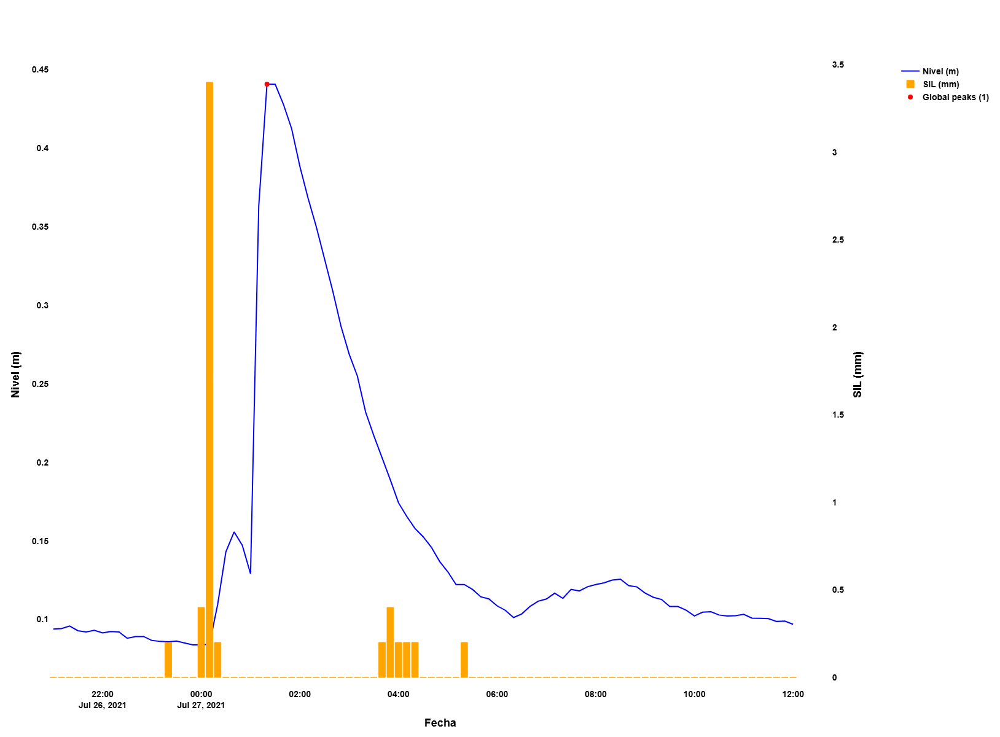

In [104]:
# Filtrar los datos en el rango de fechas especificado
fecha_inicio = pedir_fecha("Ingrese la fecha de inicio:")
fecha_fin = pedir_fecha("Ingrese la fecha de fin:")
merged = merged.loc[(merged.index >= fecha_inicio) & (merged.index <= fecha_fin)]



picos['max_global_fecha'] = pd.to_datetime(picos['max_global_fecha'], errors='coerce')
picos['max_local_fecha'] = pd.to_datetime(picos['max_local_fecha'], errors='coerce')

merged_dates = set(merged.index)
picos_valid_global = picos[picos['max_global_fecha'].isin(merged_dates)]
picos_valid_local = picos[picos['max_local_fecha'].isin(merged_dates)]

n_global = len(picos_valid_global)
n_local = len(picos_valid_local)

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
        x=merged.index,
        y=merged["nivel"],
        mode="lines",
        line=dict(color='blue'),
        name="Nivel (m)"
    ),
    secondary_y=False
)

fig.add_trace(
    go.Bar(
        x=merged.index,
        y=merged["sil"],
        name="SIL (mm)",
        marker=dict(
            color="orange",
            opacity=1,
            line=dict(
                color="orange",
                width=1
            )
        )
    ),
    secondary_y=True
)

if not picos_valid_global.empty:
    fig.add_trace(
        go.Scatter(
            x=picos_valid_global["max_global_fecha"],
            y=picos_valid_global["max_global"],
            mode="markers",
            marker=dict(color='red', size=8),
            name=f"Global peaks ({n_global})"
        ),
        secondary_y=False
    )

if not picos_valid_local.empty:
    fig.add_trace(
        go.Scatter(
            x=picos_valid_local["max_local_fecha"],
            y=picos_valid_local["max_local"],
            mode="markers",
            marker=dict(color='green', size=8),
            name=f"Local peaks ({n_local})"
        ),
        secondary_y=False
    )

fig.update_layout(
   
    xaxis_title="Fecha",
    xaxis=dict(
        title_font=dict(size=18, family='Arial', color='black', weight='bold'),
        tickfont=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    yaxis=dict(
        title_text="Nivel (m)",
        title_font=dict(size=18, family='Arial', color='black', weight='bold'),
        tickfont=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    yaxis2=dict(
        title_text="SIL (mm)",
        title_font=dict(size=18, family='Arial', color='black', weight='bold'),
        tickfont=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    legend=dict(
        x=1.02,
        y=1,
        bgcolor='rgba(255,255,255,0)',
        font=dict(size=14, family='Arial', color='black', weight='bold')
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    width=1200,  # Tamaño del gráfico
    height=1200,  # Tamaño del gráfico
    font=dict(family='Arial', color='black', size=14, weight='bold')
)

fig.show()